# **Imports**

---
Below are all the **Modules** used in the **Notebook**.

In [1]:
from IPython.display import clear_output as cls
!pip install tf_explain
cls()

In [2]:
# Common
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf

# Data Loading
import tensorflow.data as tfd
import tensorflow.image as tfi
from tensorflow.keras.utils import load_img, img_to_array

# Data Visualization
import matplotlib.pyplot as plt

# Models 
from keras.layers import ReLU
from keras.layers import Layer
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Concatenate
from keras.layers import UpSampling2D
from keras.layers import AveragePooling2D
from keras.models import Sequential, Model
from keras.layers import BatchNormalization

# Re Trained Model
from tensorflow.keras.applications import ResNet50

# Model Visualization
from tensorflow.keras.utils import plot_model

# Callbacks 
from keras.callbacks import Callback, ModelCheckpoint

# Model Explaination
from tf_explain.core.grad_cam import GradCAM

# **Data Loading**

In [3]:
# Specify Root Path
root_path = '/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant/'

# All Images
image_paths = glob(root_path + "*).png")
n_images = len(image_paths)

# Show
print(f"Total Number of Images : {n_images}")

Total Number of Images : 210


In [4]:
def load_image(path, IMAGE_SIZE):
    image = img_to_array(load_img(path))
    image = tfi.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
    image = tf.cast(image, tf.float32)
    image = image/255.
    return image

def load_data(image_paths, trim=None, IMAGE_SIZE=256, BATCH_SIZE=8, files=False):
    
    # Collect Paths
    if trim is not None:
        image_paths = image_paths[:trim]
    
    mask_paths = []
    for path in image_paths:
        mask_path = path.replace(".png", "_mask.png")
        mask_paths.append(mask_path)
    
    # Create Space
    images, masks = np.zeros(shape=(len(image_paths), IMAGE_SIZE, IMAGE_SIZE, 3)), np.zeros(shape=(len(image_paths), IMAGE_SIZE, IMAGE_SIZE, 3))
    
    # Load Images
    for i, (image_path, mask_path) in tqdm(enumerate(zip(image_paths, mask_paths)), desc="Loading"):
        image = load_image(image_path, IMAGE_SIZE=IMAGE_SIZE)
        mask  = load_image(mask_path, IMAGE_SIZE=IMAGE_SIZE)
        images[i] = image
        masks[i] = mask
    
    # Dataset
    data = tfd.Dataset.from_tensor_slices((images, masks))
    data = data.shuffle(1000).batch(BATCH_SIZE, drop_remainder=True)
    data = data.prefetch(tfd.AUTOTUNE)
    
    if files:
        return data, images, masks
    return data

In [5]:
train_ds = load_data(image_paths, trim=200)
valid_ds, val_images, val_masks = load_data(image_paths, trim=10, files=True)

Loading: 0it [00:00, ?it/s]2022-12-09 11:59:33.595516: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-09 11:59:33.691768: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-09 11:59:33.692585: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-09 11:59:33.695419: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow 

# **Data Visualization**

In [6]:
def show_images(data, model=None, explain=False, n_images=6, SIZE=(25,10)):
    
    # Plot Configurations
    if model is not None:
        if explain:
            n_cols = 5
        else:
            n_cols = 4
    else:
        n_cols = 3
    
    # Iterate through data 
    for plot_no in range(1, n_images+1):
        for index, (images, masks) in enumerate(iter(data)):
            
            # Select Items 
            id = np.random.randint(len(images))
            image, mask = images[id], masks[id]
            
            if model is not None:
                
                if explain:
                    
                    # Make Prediction
                    pred_mask = model.predict(image[np.newaxis, ...])[0]
                    
                    # Grad CAM
                    cam = GradCAM()
                    cam = cam.explain(
                        validation_data=(val_images[id][np.newaxis,...], val_masks[id]),
                        model=model,
                        class_index=1,
                        layer_name="Top-ConvBlock-2",
                        image_weight=0.5
                    )
                    
                    # Figure
                    plt.figure(figsize=SIZE)

                    # Original Image
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")

                    # Original Mask
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask)
                    plt.axis('off')
                    plt.title('Original Mask')

                    # Predicted Mask
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask)
                    plt.axis('off')
                    plt.title("Predicted Mask")

                    # Mixed
                    plt.subplot(1, n_cols, 4)
                    plt.imshow(image)
                    plt.imshow(pred_mask, alpha=0.4)
                    plt.axis('off')
                    plt.title("Overlaped Prediction")
                    
                    # Mixed
                    plt.subplot(1, n_cols, 5)
                    plt.imshow(cam)
                    plt.axis('off')
                    plt.title("Grad CAM")

                    # Show Image
                    plt.show()
                    
                else:
                    # Make Prediction
                    pred_mask = model.predict(image[np.newaxis, ...])[0]

                    # Figure
                    plt.figure(figsize=SIZE)

                    # Original Image
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")

                    # Original Mask
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask)
                    plt.axis('off')
                    plt.title('Original Mask')

                    # Predicted Mask
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask)
                    plt.axis('off')
                    plt.title("Predicted Mask")

                    # Mixed
                    plt.subplot(1, n_cols, 4)
                    plt.imshow(image)
                    plt.imshow(pred_mask, alpha=0.4)
                    plt.axis('off')
                    plt.title("Overlaped Prediction")

                    # Show Image
                    plt.show()
                
            else:
                
                # Figure
                plt.figure(figsize=SIZE)
                
                # Original Image
                plt.subplot(1, n_cols, 1)
                plt.imshow(image)
                plt.axis('off')
                plt.title("Original Image")
                
                # Original Mask
                plt.subplot(1, n_cols, 2)
                plt.imshow(mask)
                plt.axis('off')
                plt.title('Original Mask')
                
                # Mixed
                plt.subplot(1, n_cols, 3)
                plt.imshow(image)
                plt.imshow(mask, alpha=0.4)
                plt.axis('off')
                plt.title("Overlaped Image")
                
                # Show Image
                plt.show()
            
            # Break Loop
            break

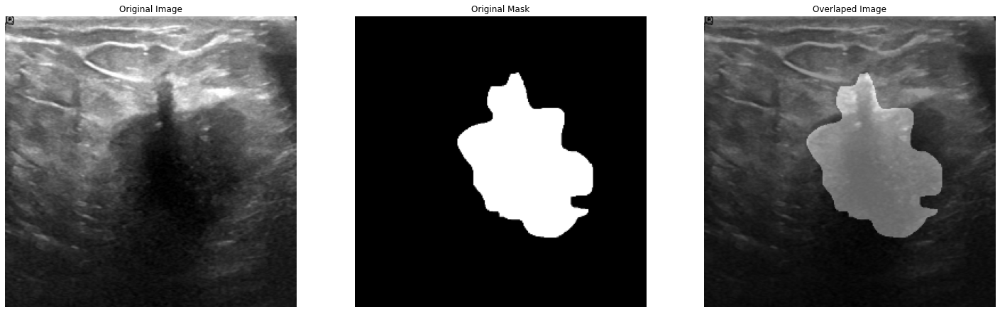

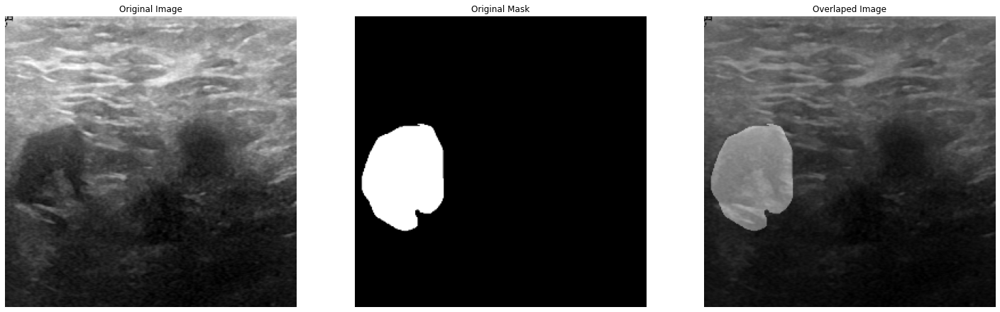

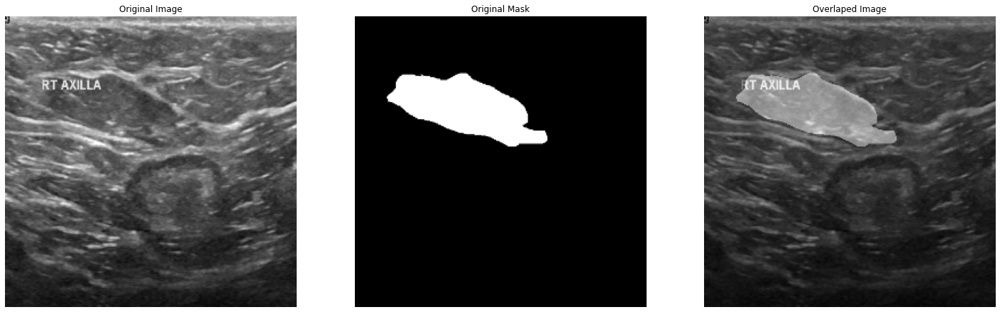

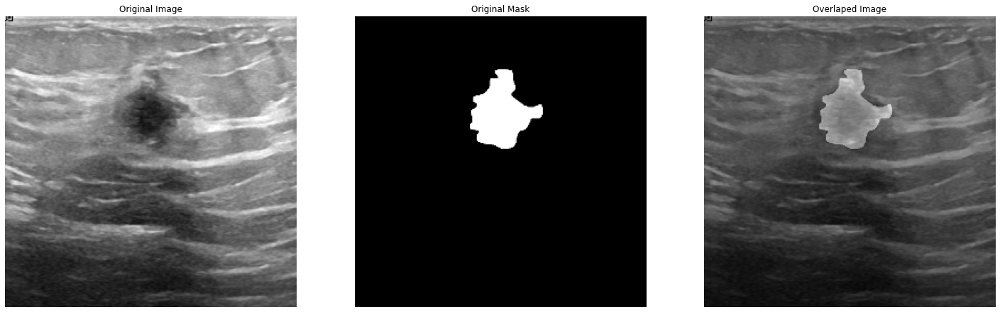

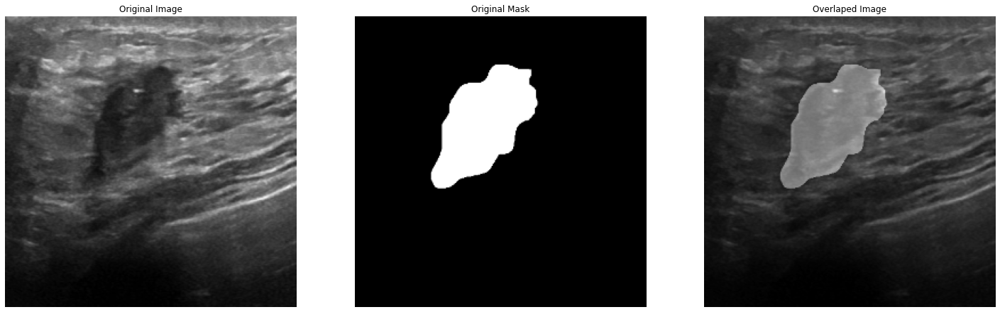

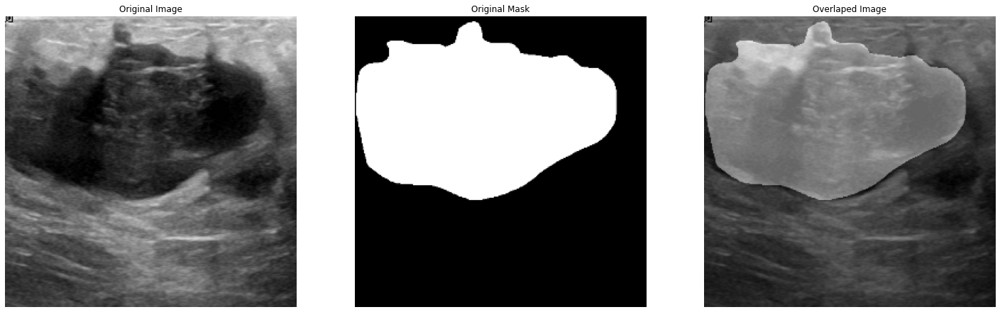

In [7]:
show_images(data=train_ds)

This is going to be a tough task.

# **DeepLabV3+**

In [8]:
class ConvBlock(Layer):
    
    def __init__(self, filters=256, kernel_size=3, use_bias=False, dilation_rate=1, **kwargs):
        super(ConvBlock, self).__init__(**kwargs)
        
        self.filters = filters
        self.kernel_size = kernel_size
        self.use_bias = use_bias
        self.dilation_rate = dilation_rate
        
        self.net = Sequential([
            Conv2D(filters, kernel_size=kernel_size, strides=1, padding='same', dilation_rate=dilation_rate, use_bias=use_bias, kernel_initializer='he_normal'),
            BatchNormalization(),
            ReLU()
        ])
    
    def call(self, X): return self.net(X)        
        
    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "kernel_size":self.kernel_size,
            "use_bias":self.use_bias,
            "dilation_rate":self.dilation_rate
        }

In [9]:
def AtrousSpatialPyramidPooling(X):
    
    # Shapes 
    _, height, width, _ = X.shape
    
    # Image Pooling 
    image_pool = AveragePooling2D(pool_size=(height, width), name="ASPP-AvgPool2D")(X)
    image_pool = ConvBlock(kernel_size=1, name="ASPP-ConvBlock-1")(image_pool)
    image_pool = UpSampling2D(size=(height//image_pool.shape[1], width//image_pool.shape[2]), name="ASPP-UpSampling")(image_pool)
    
    # Conv Blocks
    conv_1 = ConvBlock(kernel_size=1, dilation_rate=1, name="ASPP-Conv-1")(X)
    conv_6 = ConvBlock(kernel_size=3, dilation_rate=6, name="ASPP-Conv-6")(X)
    conv_12 = ConvBlock(kernel_size=3, dilation_rate=12, name="ASPP-Conv-12")(X)
    conv_18 = ConvBlock(kernel_size=3, dilation_rate=18, name="ASPP-Conv-18")(X)
    
    # Concat All
    concat = Concatenate(axis=-1, name="ASPP-Concat")([image_pool, conv_1, conv_6, conv_12, conv_18])
    net = ConvBlock(kernel_size=1, name="ASPP-Net")(concat)
    
    return net

In [10]:
# PARAM
LR = 1e-3
IMAGE_SIZE = 256

# Input
InputL = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")

# Base Mode
resnet50 = ResNet50(include_top=False, weights='imagenet', input_tensor=InputL)

# ASPP Phase
DCNN = resnet50.get_layer('conv4_block6_2_relu').output
ASPP = AtrousSpatialPyramidPooling(DCNN)
ASPP = UpSampling2D(size=(IMAGE_SIZE//4//ASPP.shape[1], IMAGE_SIZE//4//ASPP.shape[2]), name="AtrousSpatial")(ASPP)

# LLF Phase
LLF = resnet50.get_layer('conv2_block3_2_relu').output
LLF = ConvBlock(filters=48, kernel_size=1, name="LLF-ConvBlock")(LLF)

# Combined
combined = Concatenate(axis=-1, name="Combine-LLF-ASPP")([ASPP, LLF])
features = ConvBlock(name="Top-ConvBlock-1")(combined)
features = ConvBlock(name="Top-ConvBlock-2")(features)
upsample = UpSampling2D(size=(IMAGE_SIZE//features.shape[1], IMAGE_SIZE//features.shape[1]), interpolation='bilinear', name="Top-UpSample")(features)

# Output Mask
PredMask = Conv2D(3, kernel_size=3, strides=1, padding='same', activation='sigmoid', use_bias=False, name="OutputMask")(upsample)

# DeelLabV3+ Model
model = Model(InputL, PredMask, name="DeepLabV3-Plus")
model.summary()

94781440/94765736 [==============================] - 1s 0us/step
Model: "DeepLabV3-Plus"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
InputLayer (InputLayer)         [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           InputLayer[0][0]                 
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
____________________

# **DeepLabV3+ Visualization**

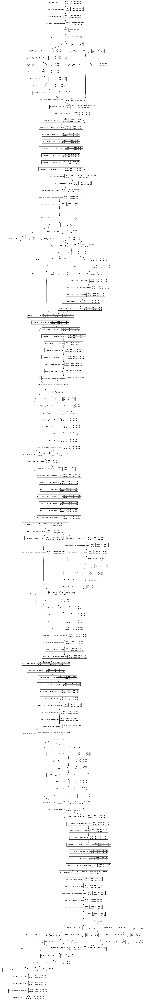

In [11]:
plot_model(model, "DeepLabV3+.png", show_shapes=True, dpi=96)

# **DeepLabV3+ - Training**

Epoch 1/50


2022-12-09 12:00:00.659022: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-12-09 12:00:02.747235: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


25/25 [==============================] - 17s 198ms/step - loss: 0.2986 - val_loss: 38.6696


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/50
25/25 [==============================] - 4s 144ms/step - loss: 0.2082 - val_loss: 0.4687
Epoch 3/50
25/25 [==============================] - 4s 142ms/step - loss: 0.1651 - val_loss: 0.8273
Epoch 4/50
25/25 [==============================] - 4s 141ms/step - loss: 0.1449 - val_loss: 0.7267
Epoch 5/50
25/25 [==============================] - 4s 140ms/step - loss: 0.1372 - val_loss: 0.3097


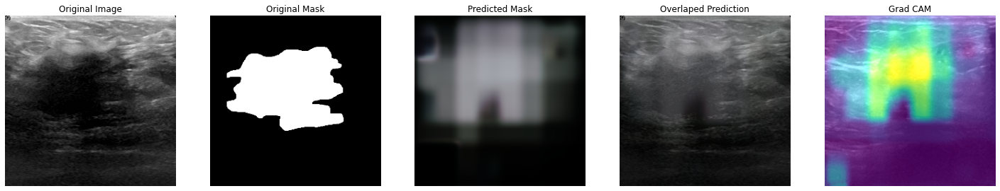

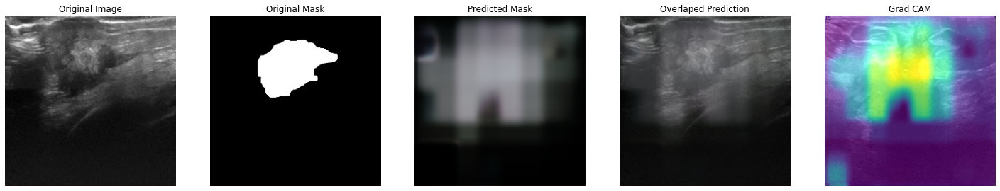

Epoch 6/50
25/25 [==============================] - 4s 143ms/step - loss: 0.1192 - val_loss: 0.4066
Epoch 7/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0883 - val_loss: 0.4393
Epoch 8/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0784 - val_loss: 0.3206
Epoch 9/50
25/25 [==============================] - 4s 140ms/step - loss: 0.0808 - val_loss: 0.2803
Epoch 10/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0767 - val_loss: 0.6133


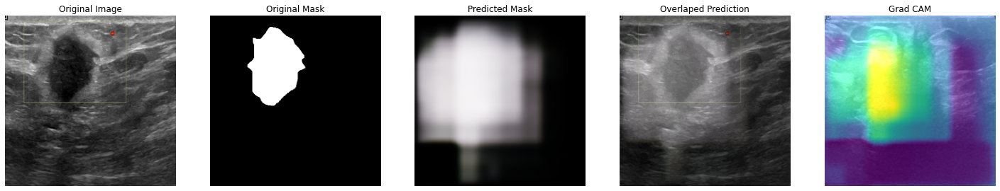

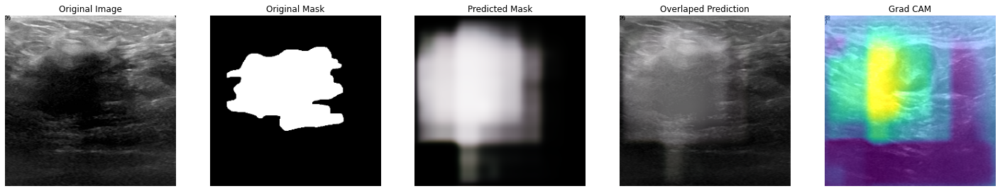

Epoch 11/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0654 - val_loss: 0.3313
Epoch 12/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0577 - val_loss: 0.4380
Epoch 13/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0469 - val_loss: 0.5862
Epoch 14/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0432 - val_loss: 1.0021
Epoch 15/50
25/25 [==============================] - 4s 140ms/step - loss: 0.0403 - val_loss: 0.3035


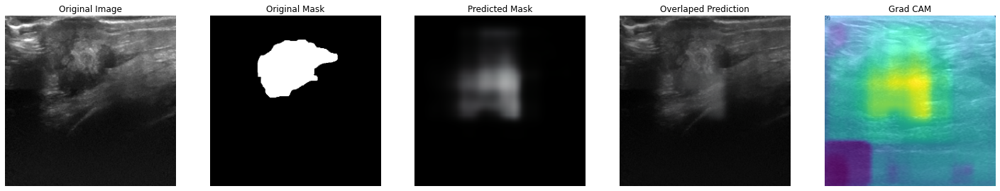

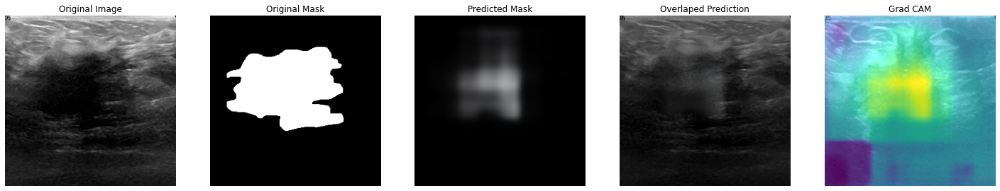

Epoch 16/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0373 - val_loss: 0.4153
Epoch 17/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0326 - val_loss: 0.3488
Epoch 18/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0303 - val_loss: 0.3337
Epoch 19/50
25/25 [==============================] - 4s 140ms/step - loss: 0.0305 - val_loss: 0.5190
Epoch 20/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0287 - val_loss: 0.7328


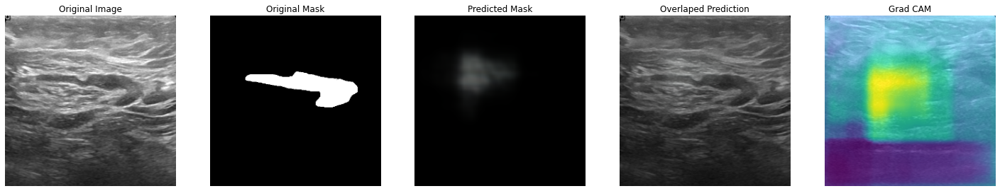

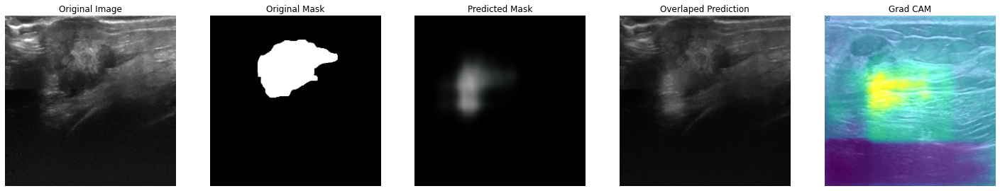

Epoch 21/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0306 - val_loss: 0.5924
Epoch 22/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0268 - val_loss: 0.5660
Epoch 23/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0234 - val_loss: 0.6085
Epoch 24/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0219 - val_loss: 0.5017
Epoch 25/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0202 - val_loss: 0.7440


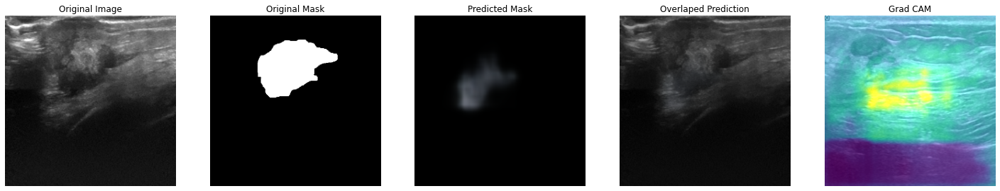

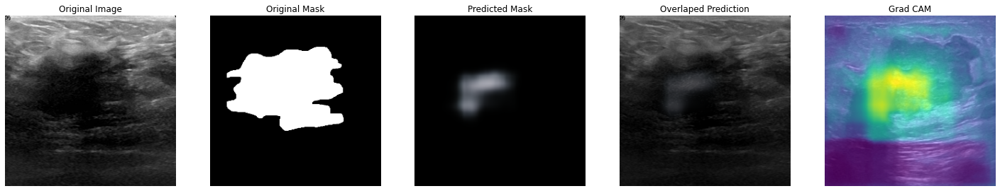

Epoch 26/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0189 - val_loss: 0.6525
Epoch 27/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0191 - val_loss: 0.8933
Epoch 28/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0189 - val_loss: 0.5875
Epoch 29/50
25/25 [==============================] - 4s 143ms/step - loss: 0.0187 - val_loss: 0.7914
Epoch 30/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0184 - val_loss: 0.4352


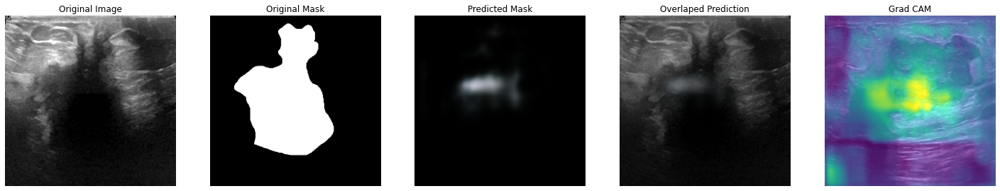

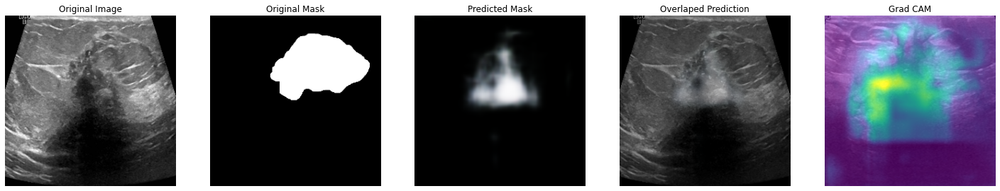

Epoch 31/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0170 - val_loss: 0.9880
Epoch 32/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0237 - val_loss: 0.7411
Epoch 33/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0505 - val_loss: 1.1788
Epoch 34/50
25/25 [==============================] - 4s 141ms/step - loss: 0.1123 - val_loss: 0.3705
Epoch 35/50
25/25 [==============================] - 4s 145ms/step - loss: 0.1241 - val_loss: 7.6627


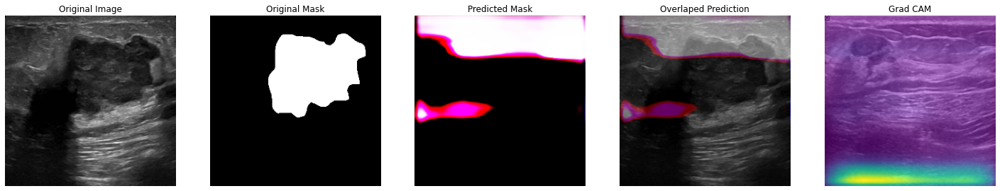

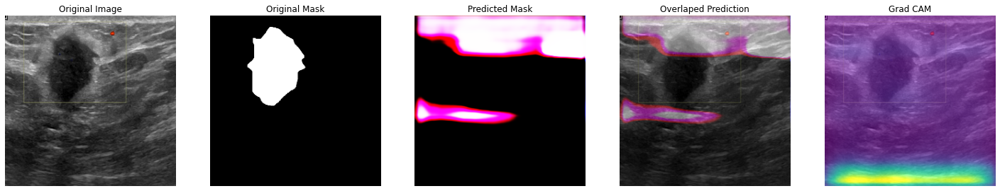

Epoch 36/50
25/25 [==============================] - 4s 141ms/step - loss: 0.1094 - val_loss: 0.6146
Epoch 37/50
25/25 [==============================] - 4s 143ms/step - loss: 0.0762 - val_loss: 0.2524
Epoch 38/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0600 - val_loss: 0.1209
Epoch 39/50
25/25 [==============================] - 4s 143ms/step - loss: 0.0429 - val_loss: 0.0633
Epoch 40/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0352 - val_loss: 0.0597


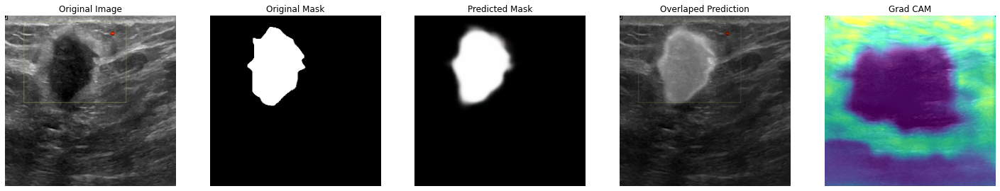

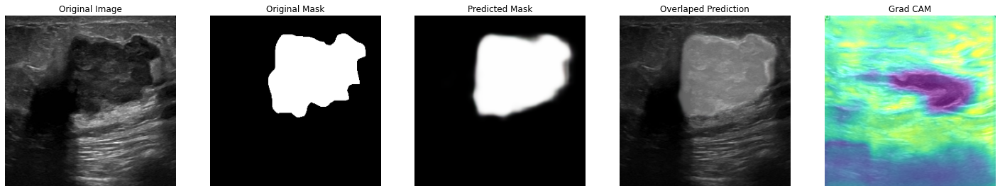

Epoch 41/50
25/25 [==============================] - 4s 143ms/step - loss: 0.0311 - val_loss: 0.0524
Epoch 42/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0273 - val_loss: 0.0442
Epoch 43/50
25/25 [==============================] - 4s 143ms/step - loss: 0.0233 - val_loss: 0.0303
Epoch 44/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0207 - val_loss: 0.0242
Epoch 45/50
25/25 [==============================] - 4s 142ms/step - loss: 0.0189 - val_loss: 0.0291


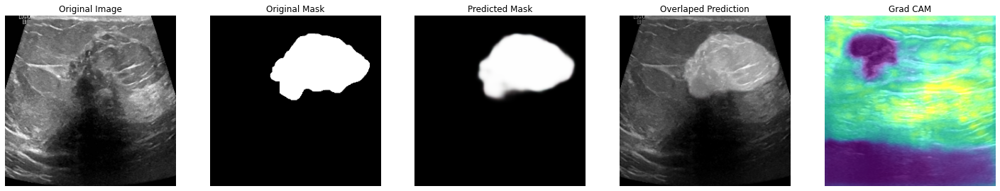

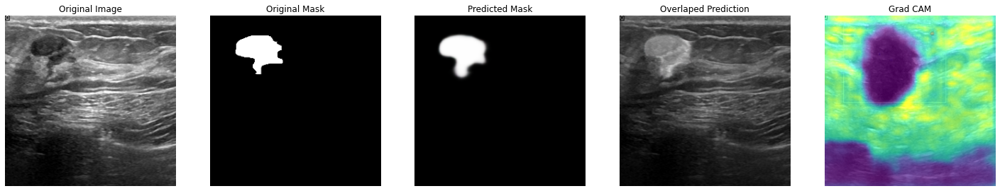

Epoch 46/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0190 - val_loss: 0.0302
Epoch 47/50
25/25 [==============================] - 4s 144ms/step - loss: 0.0174 - val_loss: 0.0179
Epoch 48/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0171 - val_loss: 0.0213
Epoch 49/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0164 - val_loss: 0.0182
Epoch 50/50
25/25 [==============================] - 4s 141ms/step - loss: 0.0151 - val_loss: 0.0152


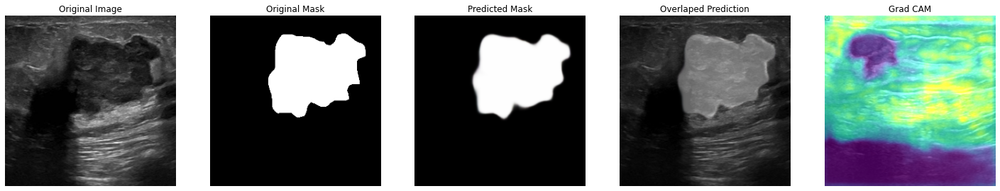

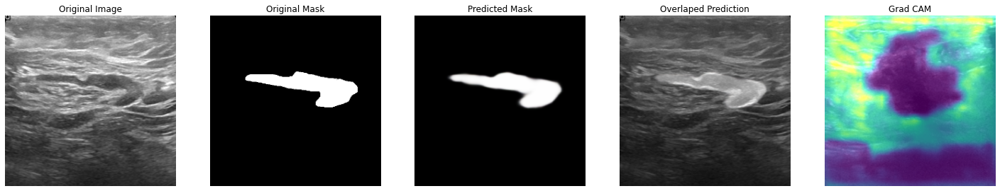

In [12]:
# Compile Model
optimizer = tf.keras.optimizers.Adam(learning_rate=LR)
model.compile(loss='binary_crossentropy', optimizer=optimizer)

# Callback
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1)%5==0:
            show_images(valid_ds, model=self.model, explain=True, n_images=2, SIZE=(25,10))

# Callbacks
callbacks = [ModelCheckpoint("DeepLabV3-Plus.h5"), ShowProgress()]

# Training
model.fit(train_ds, validation_data=valid_ds, epochs=50, callbacks=callbacks)

I trust on **my eyes rather then trusting on a metric**. That's why I have created the **Custom Callbacks** this **Custom Callbacks** shows the **Model Predictions** i.e the **Predicted Label Maps** after every **5th Epcoh**. This allow me to have a look at the **Model's Performance**. What I found with **Deep Lab V3** is that it generally get diverged during **Training** and then gets back into the form, and this **form is way better** than the form before diverging. You can notice this in the **model training phase**. 

The **training phase after the model get diverged is amazing**. All the **predicted label maps are perfect**. The **Grad CAM** visualization shows where the **model is paying the highest attention**. 

# **Model Predictions**

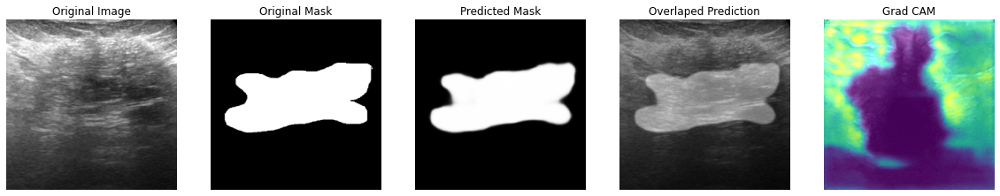

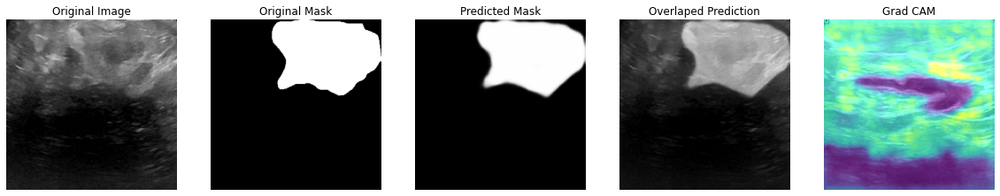

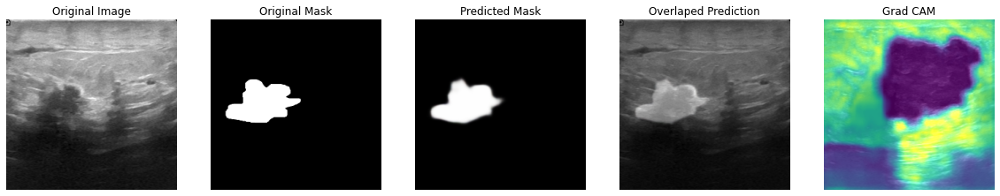

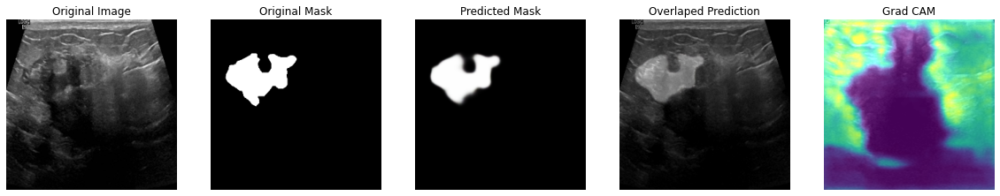

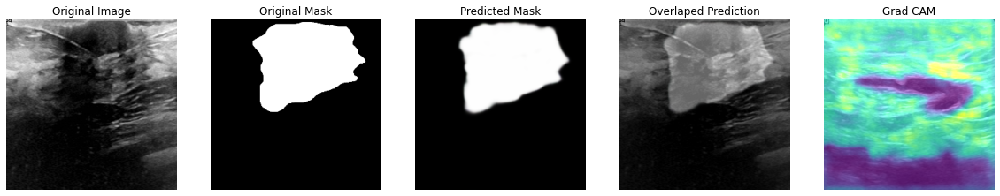

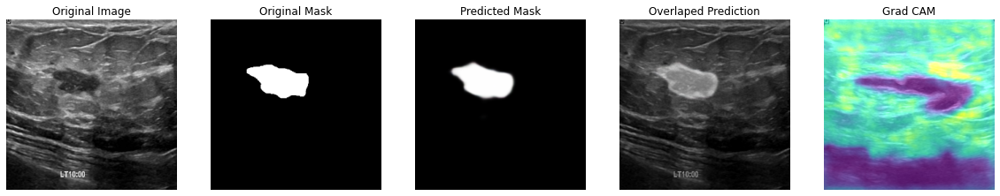

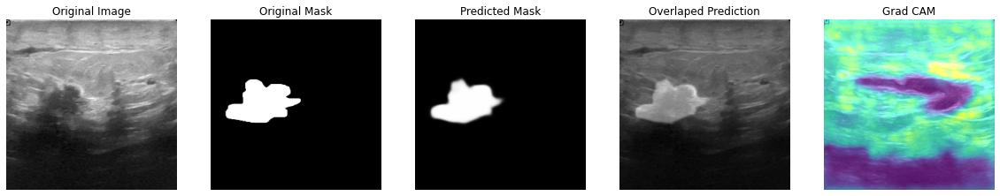

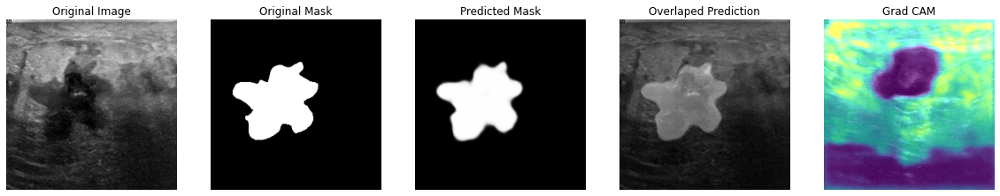

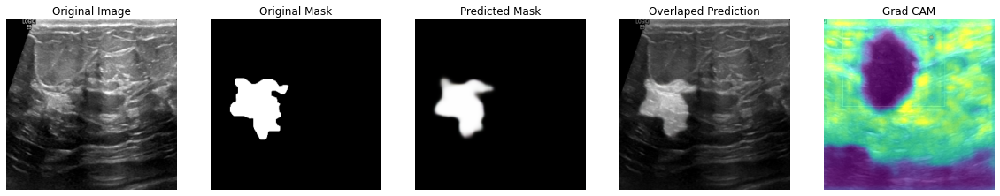

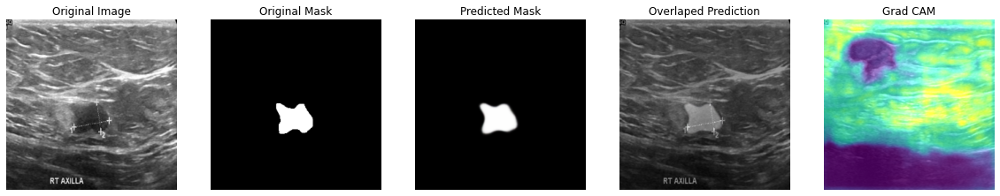

In [16]:
show_images(train_ds, model=model, explain=True, n_images=10, SIZE=(20,8))

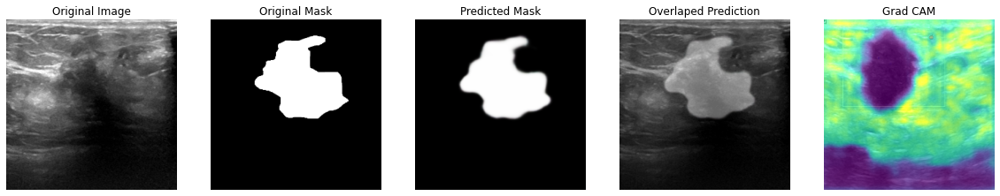

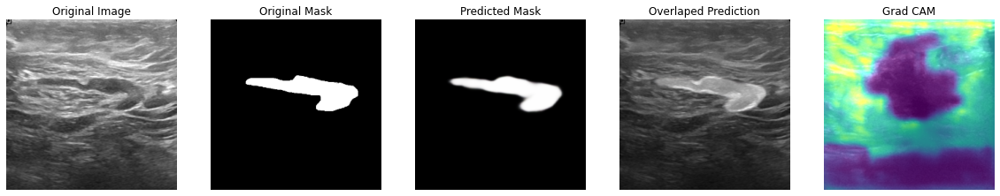

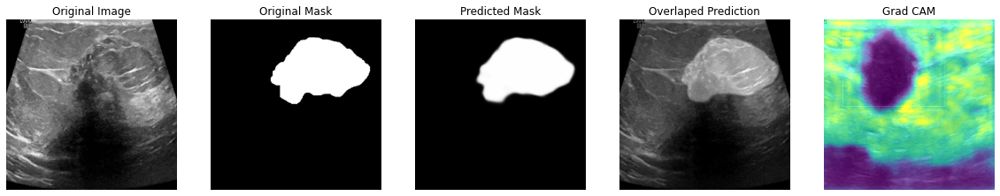

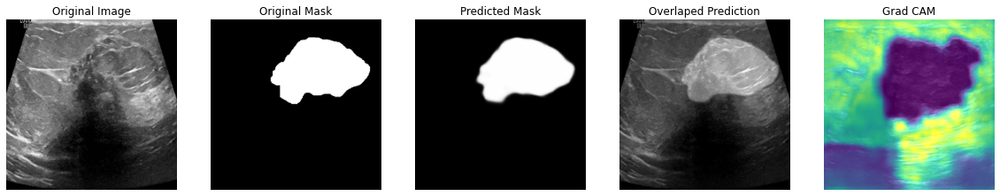

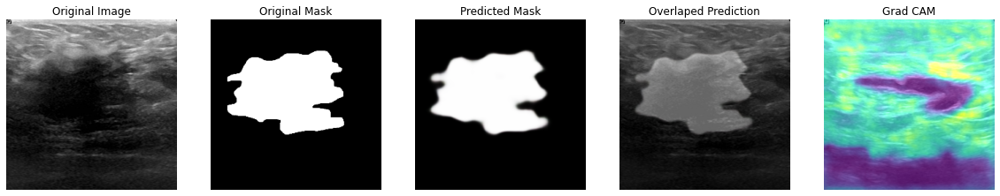

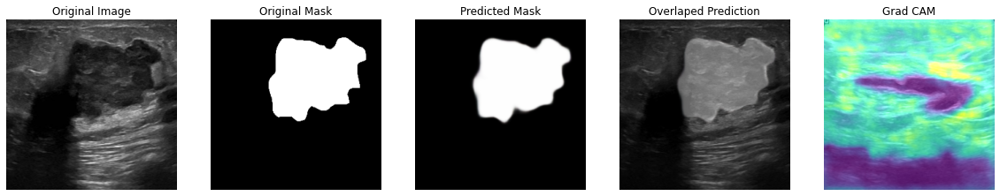

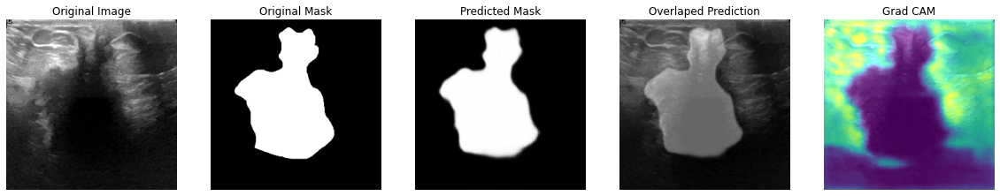

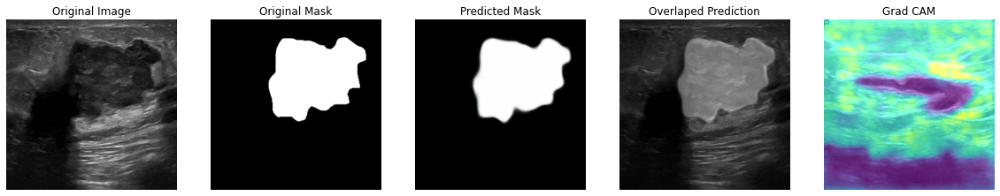

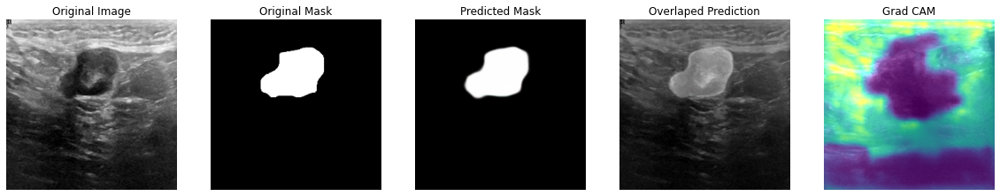

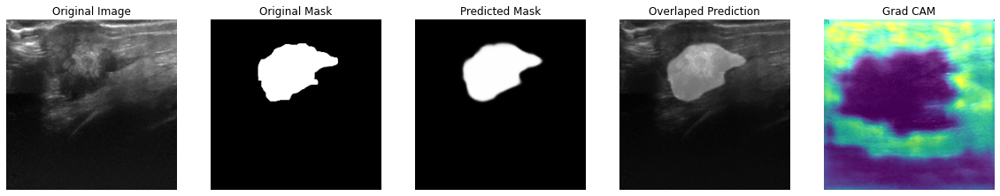

In [17]:
show_images(valid_ds, model=model, explain=True, n_images=10, SIZE=(20,8))

Wow, all the **prediction label maps** are **perfect**. That's the power of **DeepLabV3+**. Thats all from my side. Please **let me know your suggestions** in the comments. 

**ThankYou**

---
**DeepNets**